## Imports

In [3]:
from sklearn.pipeline import Pipeline
import pandas as pd
import numpy as np

from feature_engine.imputation import AddMissingIndicator, CategoricalImputer, MeanMedianImputer
from feature_engine.encoding import OneHotEncoder,CountFrequencyEncoder
from sklearn.preprocessing import FunctionTransformer,LabelEncoder,label_binarize

from sklearn.metrics import (accuracy_score, roc_auc_score,explained_variance_score,mean_squared_error,r2_score,average_precision_score, classification_report, roc_curve, auc, confusion_matrix, 
                     precision_recall_fscore_support,make_scorer, f1_score,precision_score,recall_score, ConfusionMatrixDisplay)
from sklearn.model_selection import GridSearchCV,KFold, cross_val_score
from scikitplot.metrics import plot_roc, plot_confusion_matrix, plot_precision_recall,plot_roc_curve

from sklearn.preprocessing import LabelEncoder
from sklearn.linear_model import Lasso, LinearRegression, Ridge
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, ExtraTreesClassifier, BaggingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
#from catboost import CatBoostClassifier
#from lightgbm import LGBMClassifier

import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
df = pd.read_csv('data.csv')

df_test = df.sample(frac=0.20, random_state=42) # 80% train y 20% test
df_train = df.drop(df_test.index)

X = df_train.drop('diagnostic', axis=1)
y = df_train['diagnostic']
X_test = df_test.drop('diagnostic', axis=1)
y_test = df_test.diagnostic

## Pipeline 

In [3]:
pipe = Pipeline([
    ("dropear", FunctionTransformer(lambda x: x.drop(["img_id","patient_id","lesion_id"], axis=1, errors='ignore'))),
    ("indicador_NAs",AddMissingIndicator(missing_only= True,variables = ["has_sewage_system","fitspatrick","diameter_1","diameter_2","skin_cancer_history","cancer_history","has_piped_water","background_father","background_mother","pesticide","smoke","drink"])),
    ("missing_categoricas",CategoricalImputer(variables = ["has_sewage_system","region","gender"])),
    ("encoding_onehot",OneHotEncoder(variables = ["region","gender"])),
    ("frequency_encoder", CountFrequencyEncoder(encoding_method='frequency',missing_values='ignore', variables=["background_father","background_mother"])),
    ("NaN_father",FunctionTransformer(lambda x: x.assign(background_father = x['background_father'].fillna(0)))),
    ("NaN_mother",FunctionTransformer(lambda x: x.assign(background_mother = x['background_mother'].fillna(0)))),
    ("tf_itch", FunctionTransformer(lambda x: x.assign(itch = x['itch'].apply(lambda x: 1 if x=="TRUE" else 0)))),
    ("tf_grew", FunctionTransformer(lambda x: x.assign(grew = x['grew'].apply(lambda x: 1 if x=="TRUE" else 0)))),
    ("tf_hurt", FunctionTransformer(lambda x: x.assign(hurt = x['hurt'].apply(lambda x: 1 if x=="TRUE" else 0)))),
    ("tf_changed", FunctionTransformer(lambda x: x.assign(changed = x['changed'].apply(lambda x: 1 if x=="TRUE" else 0)))),
    ("tf_bleed", FunctionTransformer(lambda x: x.assign(bleed = x['bleed'].apply(lambda x: 1 if x=="TRUE" else 0)))),
    ("tf_elevation", FunctionTransformer(lambda x: x.assign(elevation = x['elevation'].apply(lambda x: 1 if x=="TRUE" else 0)))),
    ("tf_biopsed",FunctionTransformer(lambda x: x.assign(biopsed = x['biopsed'].apply(lambda val: 1 if val else 0)))),
    ("tf_sewage", FunctionTransformer(lambda x: x.assign(has_sewage_system = x['has_sewage_system'].replace("Missing", False).fillna(False).astype(int).apply(lambda val: 1 if val else 0)))),
    ("tf_skin_cancer_history", FunctionTransformer(lambda x: x.assign(skin_cancer_history = x['skin_cancer_history'].replace("Missing", False).fillna(False).astype(int).apply(lambda val: 1 if val else 0)))),
    ("tf_cancer_history", FunctionTransformer(lambda x: x.assign(cancer_history = x['cancer_history'].replace("Missing", False).fillna(False).astype(int).apply(lambda val: 1 if val else 0)))),
    ("tf_pipedwater", FunctionTransformer(lambda x: x.assign(has_piped_water = x['has_piped_water'].replace("Missing", False).fillna(False).astype(int).apply(lambda val: 1 if val else 0)))),
    ("tf_pesticide", FunctionTransformer(lambda x: x.assign(pesticide = x['pesticide'].replace("Missing", False).fillna(False).astype(int).apply(lambda val: 1 if val else 0)))),
    ("tf_smoke", FunctionTransformer(lambda x: x.assign(smoke = x['smoke'].replace("Missing", False).fillna(False).astype(int).apply(lambda val: 1 if val else 0)))),
    ("tf_drink", FunctionTransformer(lambda x: x.assign(drink = x['drink'].replace("Missing", False).fillna(False).astype(int).apply(lambda val: 1 if val else 0)))),
    ("imputar_numericas",MeanMedianImputer( imputation_method = "median", variables= ["fitspatrick","diameter_1","diameter_2","age"])),
])


columnas = ['smoke', 'drink', 'background_father', 'background_mother', 'age',
       'pesticide', 'skin_cancer_history', 'cancer_history', 'has_piped_water',
       'has_sewage_system', 'fitspatrick', 'diameter_1', 'diameter_2', 'itch',
       'grew', 'hurt', 'changed', 'bleed', 'elevation', 'biopsed',
       'has_sewage_system_na', 'fitspatrick_na', 'diameter_1_na',
       'diameter_2_na', 'skin_cancer_history_na', 'cancer_history_na',
       'has_piped_water_na', 'background_father_na', 'background_mother_na',
       'pesticide_na', 'smoke_na', 'drink_na', 'region_ARM', 'region_NECK',
       'region_FACE', 'region_HAND', 'region_FOREARM', 'region_CHEST',
       'region_NOSE', 'region_THIGH', 'region_SCALP', 'region_EAR',
       'region_BACK', 'region_FOOT', 'region_ABDOMEN', 'region_LIP',
       'gender_Missing', 'gender_FEMALE', 'gender_MALE']

In [4]:
pipe.fit(X)
X2 = pipe.transform(X)
X_test2 = pipe.transform(X_test)

C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\feature_engine\encoding\base_encoder.py:255: UserWarning: During the encoding, NaN values were introduced in the feature(s) background_father, background_mother.
  warnings.warn(
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\feature_engine\encoding\base_encoder.py:255: UserWarning: During the encoding, NaN values were introduced in the feature(s) background_father, background_mother.
  warnings.warn(
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\feature_engine\encoding\base_encoder.py:255: UserWarning: During the encoding, NaN values were introduced in the feature(s) background_father, background_mother.
  warnings.warn(


In [5]:
label_encoder = LabelEncoder()
y2 = label_encoder.fit_transform(y)
y_test2 = label_encoder.transform(y_test)


## Modelo

### Generación y optimización 

#### Random Forest

In [6]:
random_forest_model = RandomForestClassifier(random_state=31)

param_grid = {
    'n_estimators': [100, 500, 1000],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

scoring = make_scorer(accuracy_score)
grid_search = GridSearchCV(estimator=random_forest_model, param_grid=param_grid, scoring=scoring, cv=3, n_jobs=-1)
grid_result = grid_search.fit(X2, y2)
best_params = grid_result.best_params_

print("Mejores hiperparámetros encontrados:")
print(best_params)

random_forest_best_model = grid_result.best_estimator_
y_pred = random_forest_best_model.predict(X_test2)

accuracy = accuracy_score(y_test2, y_pred)
print(f'Accuracy: {accuracy}')



C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
324 fits failed out of a total of 972.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
149 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py", line 638, in _validate_params


Mejores hiperparámetros encontrados:
{'max_depth': 20, 'max_features': 'sqrt', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100}
Accuracy: 0.8153310104529616


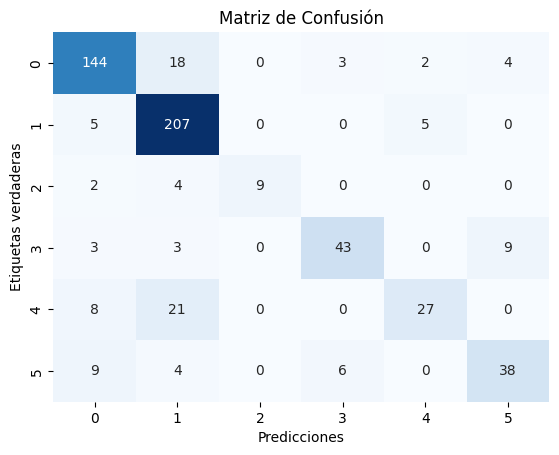

Informe de Clasificación:
               precision    recall  f1-score   support

           0       0.84      0.84      0.84       171
           1       0.81      0.95      0.87       217
           2       1.00      0.60      0.75        15
           3       0.83      0.74      0.78        58
           4       0.79      0.48      0.60        56
           5       0.75      0.67      0.70        57

    accuracy                           0.82       574
   macro avg       0.84      0.71      0.76       574
weighted avg       0.82      0.82      0.81       574



In [7]:
conf_matrix = confusion_matrix(y_test2, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

plt.xlabel('Predicciones')
plt.ylabel('Etiquetas verdaderas')
plt.title('Matriz de Confusión')
plt.show()

class_report = classification_report(y_test2, y_pred)
print("Informe de Clasificación:\n", class_report)

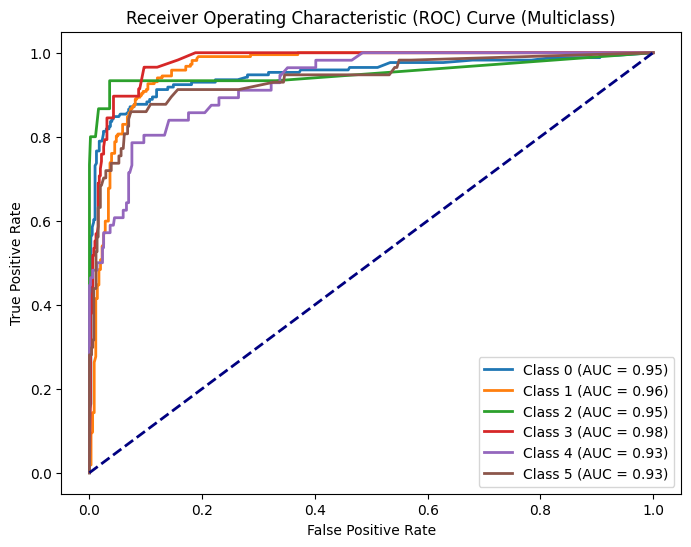

In [8]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import numpy as np

y_test_bin = label_binarize(y_test2, classes=np.unique(y_test2))
plt.figure(figsize=(8, 6))

for i in range(y_test_bin.shape[1]):
    y_scores = random_forest_best_model.predict_proba(X_test2)[:, i]
    fpr, tpr, _ = roc_curve(y_test_bin[:, i], y_scores)
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=2, label=f'Class {i} (AUC = {roc_auc:.2f})')

# Configura la apariencia de la gráfica
plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve (Multiclass)')
plt.legend(loc='lower right')
plt.show()


<Axes: >

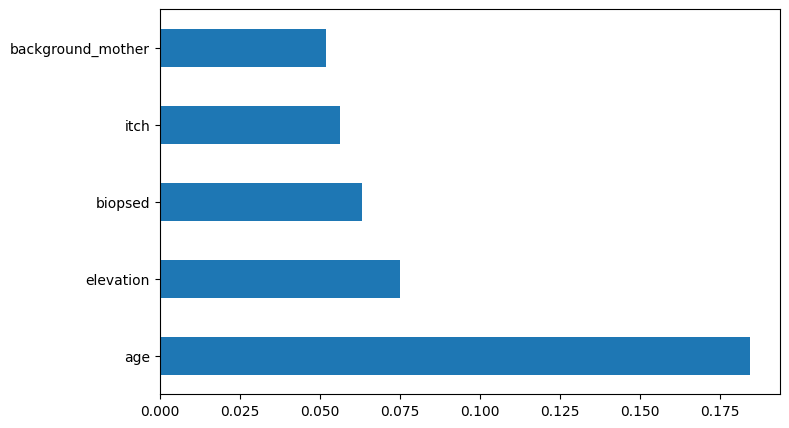

In [9]:
feature_importances = pd.Series(random_forest_best_model.feature_importances_,index = columnas)
feature_importances.nlargest(5).plot(kind='barh', color = '#1e77b4', figsize = (8, 5))

Cross Validation Scores:  [0.7826087  0.79652174 0.78571429]
Average CV Score:  0.7882815734989648
Number of CV Scores used in Average:  3


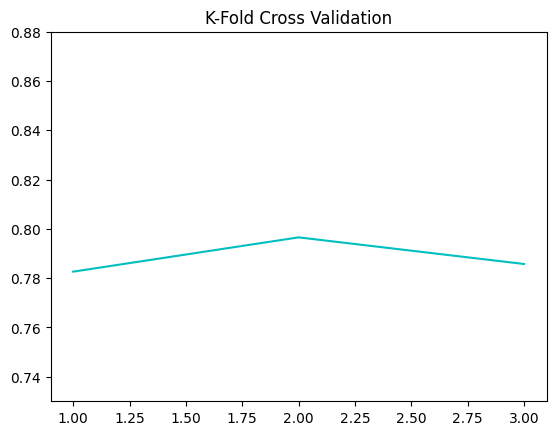

In [46]:
k_folds = KFold(n_splits=3)
scores = cross_val_score(random_forest_best_model, X2, y2, cv = k_folds)

print ("Cross Validation Scores: ", scores)
print ("Average CV Score: ", scores.mean())
print ("Number of CV Scores used in Average: ", len(scores))

x = np.array([1, 2, 3])
y = scores

plt.title('K-Fold Cross Validation')
plt.plot(x, y, color = 'c')
plt.ylim(0.73, 0.88)
plt.show()

#### SVM

In [11]:
model_svm = SVC(kernel='linear')

param_grid_svm = {
    'C': [10,15,20,30],}

scoring_svm = make_scorer(accuracy_score)
grid_search_svm = GridSearchCV(estimator=model_svm, param_grid=param_grid_svm, scoring=scoring_svm, cv=3, n_jobs=-1)

grid_result_svm = grid_search_svm.fit(X2, y2)
best_params_svm = grid_result_svm.best_params_

print("Mejores hiperparámetros encontrados:")
print(best_params_svm)

best_model_svm = grid_result_svm.best_estimator_
y_pred_svm = best_model_svm.predict(X_test2)

accuracy_svm = accuracy_score(y_test2, y_pred_svm)
print(f'Accuracy: {accuracy_svm}')

Mejores hiperparámetros encontrados:
{'C': 15}
Accuracy: 0.7473867595818815


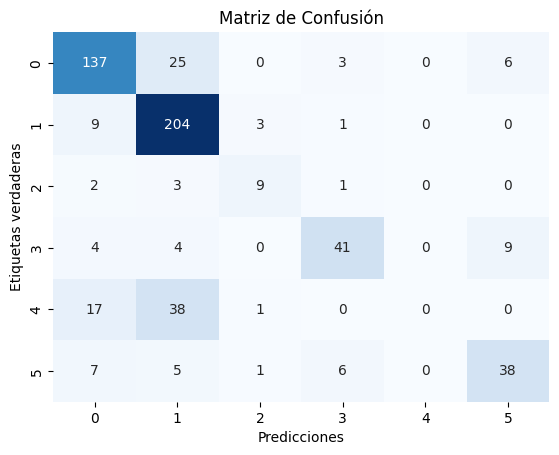

Informe de Clasificación:
               precision    recall  f1-score   support

           0       0.78      0.80      0.79       171
           1       0.73      0.94      0.82       217
           2       0.64      0.60      0.62        15
           3       0.79      0.71      0.75        58
           4       0.00      0.00      0.00        56
           5       0.72      0.67      0.69        57

    accuracy                           0.75       574
   macro avg       0.61      0.62      0.61       574
weighted avg       0.68      0.75      0.71       574



C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(r

In [12]:
conf_matrix = confusion_matrix(y_test2, y_pred_svm)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

plt.xlabel('Predicciones')
plt.ylabel('Etiquetas verdaderas')
plt.title('Matriz de Confusión')
plt.show()

class_report = classification_report(y_test2, y_pred_svm)
print("Informe de Clasificación:\n", class_report)

#### Extra Trees

In [39]:
extra_trees_model = ExtraTreesClassifier(random_state=36)

param_grid = {
    'n_estimators': [100, 500, 1000],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'max_features': ['auto', 'sqrt', 'log2']
}

scoring = make_scorer(accuracy_score)
grid_search = GridSearchCV(estimator=extra_trees_model, param_grid=param_grid, scoring=scoring, cv=3, n_jobs=-1)
grid_result = grid_search.fit(X2, y2)
best_params = grid_result.best_params_

print("Mejores hiperparámetros encontrados:")
print(best_params)

extra_best_model = grid_result.best_estimator_
y_pred = extra_best_model.predict(X_test2)

accuracy = accuracy_score(y_test2, y_pred)
print(f'Precisión del modelo: {accuracy * 100:.2f}%')


C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py:425: FitFailedWarning: 
324 fits failed out of a total of 972.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
80 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\model_selection\_validation.py", line 729, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py", line 1145, in wrapper
    estimator._validate_params()
  File "C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\base.py", line 638, in _validate_params
 

Mejores hiperparámetros encontrados:
{'max_depth': None, 'max_features': 'log2', 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 1000}
Precisión del modelo: 80.84%


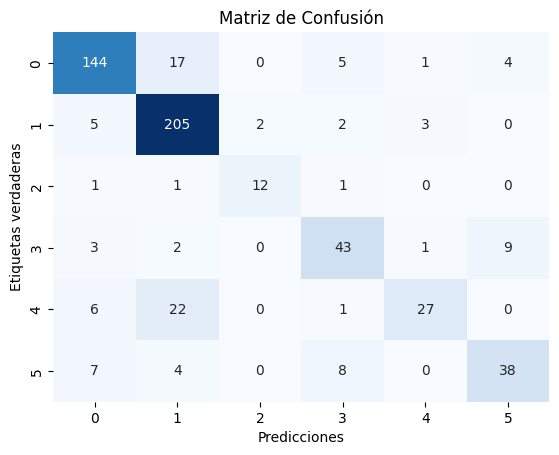

Informe de Clasificación:
               precision    recall  f1-score   support

           0       0.87      0.84      0.85       171
           1       0.82      0.94      0.88       217
           2       0.86      0.80      0.83        15
           3       0.72      0.74      0.73        58
           4       0.84      0.48      0.61        56
           5       0.75      0.67      0.70        57

    accuracy                           0.82       574
   macro avg       0.81      0.75      0.77       574
weighted avg       0.82      0.82      0.81       574



In [14]:
conf_matrix = confusion_matrix(y_test2, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

plt.xlabel('Predicciones')
plt.ylabel('Etiquetas verdaderas')
plt.title('Matriz de Confusión')
plt.show()

class_report = classification_report(y_test2, y_pred)
print("Informe de Clasificación:\n", class_report)

<Axes: >

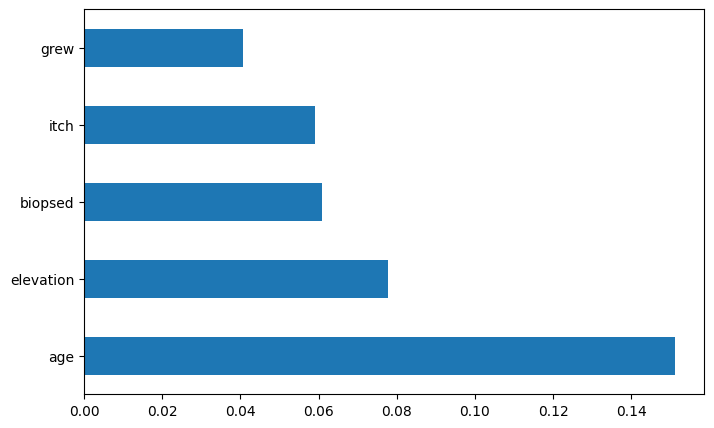

In [15]:
feature_importances = pd.Series(extra_best_model.feature_importances_,index = columnas)
feature_importances.nlargest(5).plot(kind='barh', color = '#1e77b4', figsize = (8, 5))

#### Decision Tree

In [16]:
decision_tree_model = DecisionTreeClassifier(random_state=42)

param_grid = {
    'max_depth': [None,2, 3, 5, 7, 10, 30, 50],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4],
    'class_weight': [None, 'balanced', {0: 1, 1: 2, 2: 1}] 
}

scoring = make_scorer(accuracy_score)
grid_search = GridSearchCV(estimator=decision_tree_model, param_grid=param_grid, scoring=scoring, cv=3, n_jobs=-1)
grid_result = grid_search.fit(X2, y2)
best_params = grid_result.best_params_

print("Mejores hiperparámetros encontrados:")
print(best_params)

decision_best_model = grid_result.best_estimator_
y_pred = decision_best_model.predict(X_test2)

accuracy = accuracy_score(y_test2, y_pred)
print(f'Precisión del modelo: {accuracy * 100:.2f}%')

Mejores hiperparámetros encontrados:
{'class_weight': {0: 1, 1: 2, 2: 1}, 'max_depth': 10, 'min_samples_leaf': 2, 'min_samples_split': 10}
Precisión del modelo: 71.95%


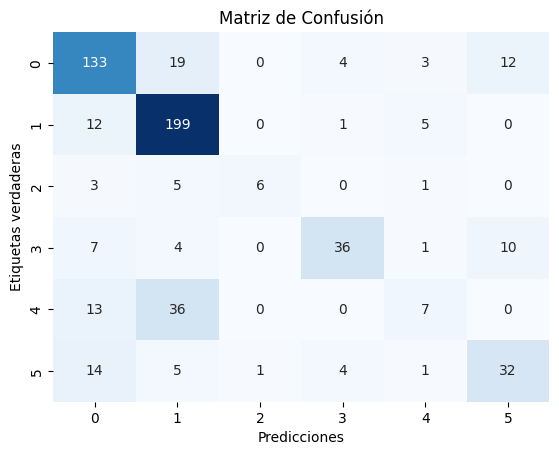

Informe de Clasificación:
               precision    recall  f1-score   support

           0       0.73      0.78      0.75       171
           1       0.74      0.92      0.82       217
           2       0.86      0.40      0.55        15
           3       0.80      0.62      0.70        58
           4       0.39      0.12      0.19        56
           5       0.59      0.56      0.58        57

    accuracy                           0.72       574
   macro avg       0.69      0.57      0.60       574
weighted avg       0.70      0.72      0.70       574



In [17]:
conf_matrix = confusion_matrix(y_test2, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

plt.xlabel('Predicciones')
plt.ylabel('Etiquetas verdaderas')
plt.title('Matriz de Confusión')
plt.show()

class_report = classification_report(y_test2, y_pred)
print("Informe de Clasificación:\n", class_report)

<Axes: >

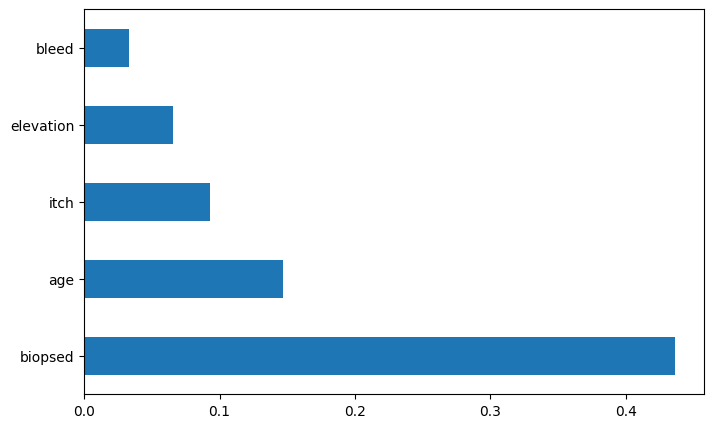

In [18]:
feature_importances = pd.Series(decision_best_model.feature_importances_,index = columnas)
feature_importances.nlargest(5).plot(kind='barh', color = '#1e77b4', figsize = (8, 5))

#### knn

In [19]:
knn = KNeighborsClassifier()

param_grid = {
    'n_neighbors': [3, 5, 7],  
    'weights': ['uniform', 'distance'],
    'p': [1, 2]  # Para la distancia Minkowski: 1 para Manhattan, 2 para Euclidiana
}

grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X2, y2)
print("Mejores hiperparámetros: ", grid_search.best_params_)
best_knn = grid_search.best_estimator_
y_pred = best_knn.predict(X_test2)

accuracy = accuracy_score(y_test2, y_pred)
print("Precisión del modelo en el conjunto de prueba: {:.2f}".format(accuracy))

Mejores hiperparámetros:  {'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
Precisión del modelo en el conjunto de prueba: 0.77


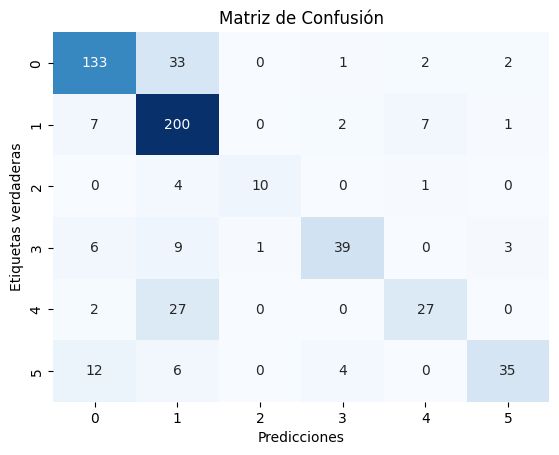

Informe de Clasificación:
               precision    recall  f1-score   support

           0       0.83      0.78      0.80       171
           1       0.72      0.92      0.81       217
           2       0.91      0.67      0.77        15
           3       0.85      0.67      0.75        58
           4       0.73      0.48      0.58        56
           5       0.85      0.61      0.71        57

    accuracy                           0.77       574
   macro avg       0.81      0.69      0.74       574
weighted avg       0.78      0.77      0.77       574



In [20]:
conf_matrix = confusion_matrix(y_test2, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

plt.xlabel('Predicciones')
plt.ylabel('Etiquetas verdaderas')
plt.title('Matriz de Confusión')
plt.show()

class_report = classification_report(y_test2, y_pred)
print("Informe de Clasificación:\n", class_report)

#### AdaBoost

In [21]:
adaboost_model = AdaBoostClassifier()

param_grid = {
    'n_estimators': [50, 100, 150], 
    'learning_rate': [0.01, 0.1, 0.5, 1.0],
}

grid_search = GridSearchCV(adaboost_model, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X2, y2)
print("Mejores hiperparámetros: ", grid_search.best_params_)
best_ada = grid_search.best_estimator_
y_pred = best_ada.predict(X_test2)

accuracy = accuracy_score(y_test2, y_pred)
print("Exactitud en el conjunto de prueba:", accuracy)

Mejores hiperparámetros:  {'learning_rate': 0.1, 'n_estimators': 100}
Exactitud en el conjunto de prueba: 0.6585365853658537


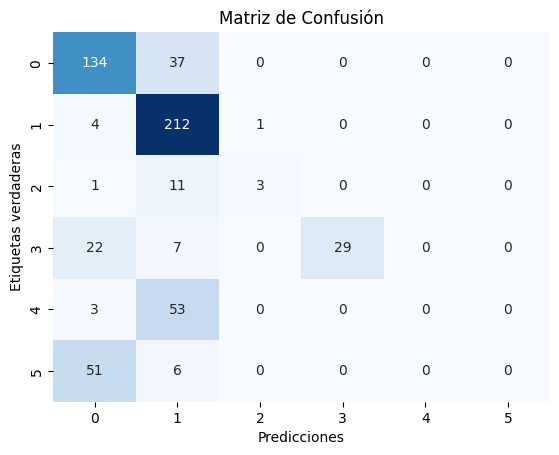

Informe de Clasificación:
               precision    recall  f1-score   support

           0       0.62      0.78      0.69       171
           1       0.65      0.98      0.78       217
           2       0.75      0.20      0.32        15
           3       1.00      0.50      0.67        58
           4       0.00      0.00      0.00        56
           5       0.00      0.00      0.00        57

    accuracy                           0.66       574
   macro avg       0.50      0.41      0.41       574
weighted avg       0.55      0.66      0.58       574



C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(r

In [22]:
conf_matrix = confusion_matrix(y_test2, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

plt.xlabel('Predicciones')
plt.ylabel('Etiquetas verdaderas')
plt.title('Matriz de Confusión')
plt.show()

class_report = classification_report(y_test2, y_pred)
print("Informe de Clasificación:\n", class_report)

<Axes: >

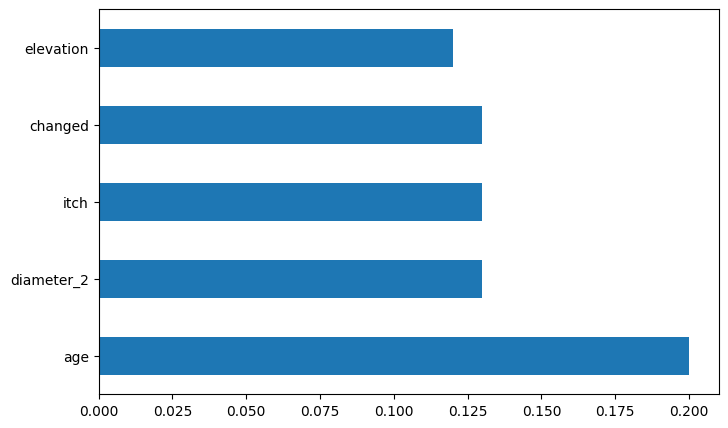

In [23]:
feature_importances = pd.Series(best_ada.feature_importances_,index = columnas)
feature_importances.nlargest(5).plot(kind='barh', color = '#1e77b4', figsize = (8, 5))

#### XGBoost

In [24]:
xg_classifier = XGBClassifier()

param_grid = {
    'n_estimators': [100, 150,200,300],  
    'learning_rate': [0.01, 0.1, 0.5, 1.0],
    'max_depth': [3, 4, 5],  
}

grid_search = GridSearchCV(xg_classifier, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X2, y2)
print("Mejores hiperparámetros: ", grid_search.best_params_)
best_xg = grid_search.best_estimator_
y_pred = best_xg.predict(X_test2)

accuracy = accuracy_score(y_test2, y_pred)
print("Exactitud en el conjunto de prueba:", accuracy)

C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\xgboost\data.py:335: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\xgboost\data.py:338: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  is_categorical_dtype(dtype) or is_pa_ext_categorical_dtype(dtype)
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\xgboost\data.py:384: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if is_categorical_dtype(dtype):
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\xgboost\data.py:359: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDt

Mejores hiperparámetros:  {'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 200}
Exactitud en el conjunto de prueba: 0.8066202090592335


C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\xgboost\data.py:335: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\xgboost\data.py:338: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  is_categorical_dtype(dtype) or is_pa_ext_categorical_dtype(dtype)
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\xgboost\data.py:384: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if is_categorical_dtype(dtype):
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\xgboost\data.py:359: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDt

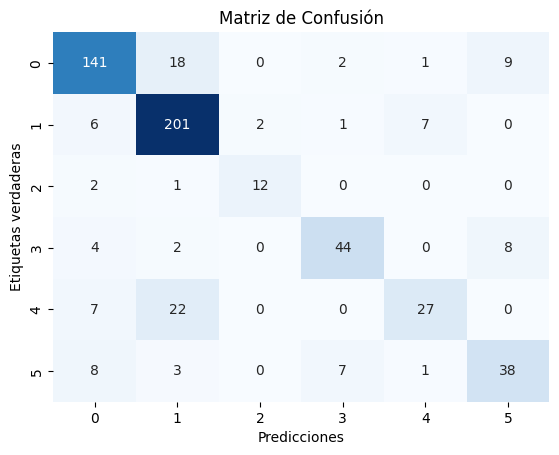

Informe de Clasificación:
               precision    recall  f1-score   support

           0       0.84      0.82      0.83       171
           1       0.81      0.93      0.87       217
           2       0.86      0.80      0.83        15
           3       0.81      0.76      0.79        58
           4       0.75      0.48      0.59        56
           5       0.69      0.67      0.68        57

    accuracy                           0.81       574
   macro avg       0.79      0.74      0.76       574
weighted avg       0.80      0.81      0.80       574



In [25]:
conf_matrix = confusion_matrix(y_test2, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

plt.xlabel('Predicciones')
plt.ylabel('Etiquetas verdaderas')
plt.title('Matriz de Confusión')
plt.show()

class_report = classification_report(y_test2, y_pred)
print("Informe de Clasificación:\n", class_report)

<Axes: >

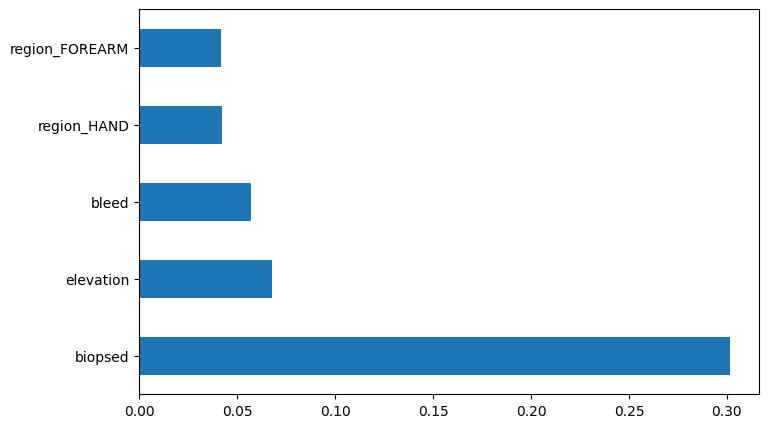

In [26]:
feature_importances = pd.Series(best_xg.feature_importances_,index = columnas)
feature_importances.nlargest(5).plot(kind='barh', color = '#1e77b4', figsize = (8, 5))

#### CatBoost

In [27]:
catboost_model = CatBoostClassifier()

param_grid = {
    'iterations': [50, 100, 150],  
    'learning_rate': [0.01, 0.1, 0.5, 1.0], 
    'depth': [3, 4, 5],  
}

grid_search = GridSearchCV(catboost_model, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X2, y2)
print("Mejores hiperparámetros: ", grid_search.best_params_)
best_cat = grid_search.best_estimator_
y_pred = best_cat.predict(X_test2)

accuracy = accuracy_score(y_test2, y_pred)
print("Exactitud en el conjunto de prueba:", accuracy)

0:	learn: 1.7709228	total: 197ms	remaining: 9.64s
1:	learn: 1.7504313	total: 198ms	remaining: 4.75s
2:	learn: 1.7338107	total: 199ms	remaining: 3.12s
3:	learn: 1.7192733	total: 200ms	remaining: 2.3s
4:	learn: 1.7027262	total: 201ms	remaining: 1.81s
5:	learn: 1.6881776	total: 202ms	remaining: 1.48s
6:	learn: 1.6727807	total: 203ms	remaining: 1.25s
7:	learn: 1.6578929	total: 204ms	remaining: 1.07s
8:	learn: 1.6417906	total: 206ms	remaining: 940ms
9:	learn: 1.6269237	total: 207ms	remaining: 830ms
10:	learn: 1.6126366	total: 208ms	remaining: 739ms
11:	learn: 1.5979334	total: 209ms	remaining: 663ms
12:	learn: 1.5866389	total: 210ms	remaining: 598ms
13:	learn: 1.5723836	total: 211ms	remaining: 543ms
14:	learn: 1.5586024	total: 212ms	remaining: 495ms
15:	learn: 1.5477577	total: 213ms	remaining: 453ms
16:	learn: 1.5365946	total: 214ms	remaining: 416ms
17:	learn: 1.5252023	total: 215ms	remaining: 382ms
18:	learn: 1.5129163	total: 216ms	remaining: 352ms
19:	learn: 1.5023955	total: 217ms	remainin

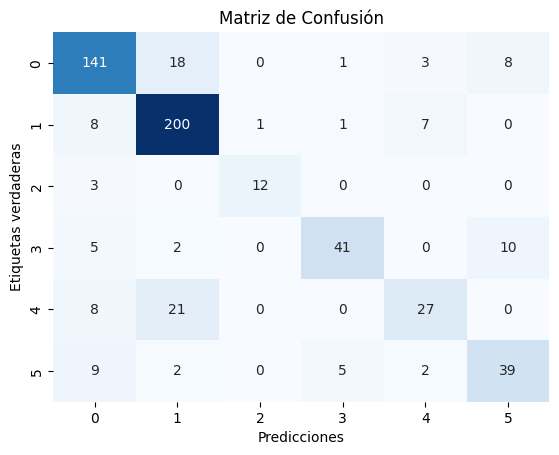

Informe de Clasificación:
               precision    recall  f1-score   support

           0       0.81      0.82      0.82       171
           1       0.82      0.92      0.87       217
           2       0.92      0.80      0.86        15
           3       0.85      0.71      0.77        58
           4       0.69      0.48      0.57        56
           5       0.68      0.68      0.68        57

    accuracy                           0.80       574
   macro avg       0.80      0.74      0.76       574
weighted avg       0.80      0.80      0.80       574



In [28]:
conf_matrix = confusion_matrix(y_test2, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

plt.xlabel('Predicciones')
plt.ylabel('Etiquetas verdaderas')
plt.title('Matriz de Confusión')
plt.show()

class_report = classification_report(y_test2, y_pred)
print("Informe de Clasificación:\n", class_report)

<Axes: >

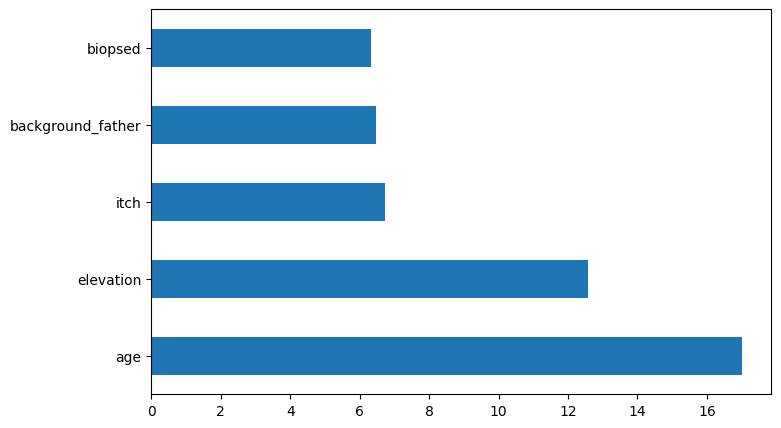

In [29]:
feature_importances = pd.Series(best_cat.feature_importances_,index = columnas)
feature_importances.nlargest(5).plot(kind='barh', color = '#1e77b4', figsize = (8, 5))

#### LGBM model

In [30]:
lgbm_model = LGBMClassifier(objective="multiclass", class_weight='balanced')

param_grid = {
    'n_estimators': [50, 100, 150],  
    'learning_rate': [0.01, 0.1, 0.5, 1.0],  
    'max_depth': [3, 4, 5], 
}

grid_search = GridSearchCV(lgbm_model, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X2, y2)
print("Mejores hiperparámetros: ", grid_search.best_params_)
best_lgbm_model = grid_search.best_estimator_
y_pred = best_lgbm_model.predict(X_test2)

accuracy = accuracy_score(y_test2, y_pred)
print("Exactitud en el conjunto de prueba:", accuracy)

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000223 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 238
[LightGBM] [Info] Number of data points in the train set: 1379, number of used features: 45
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791760
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Info] Start training from score -1.791759
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No f

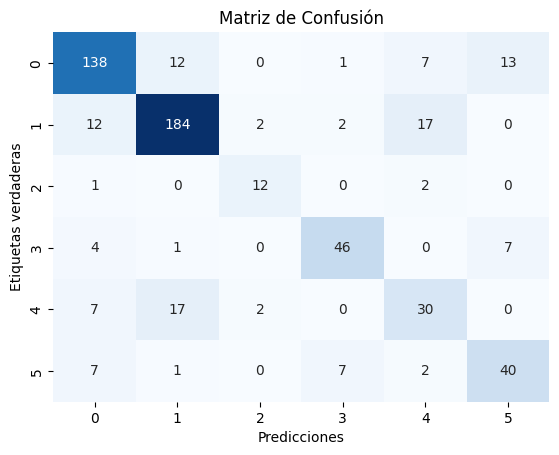

Informe de Clasificación:
               precision    recall  f1-score   support

           0       0.82      0.81      0.81       171
           1       0.86      0.85      0.85       217
           2       0.75      0.80      0.77        15
           3       0.82      0.79      0.81        58
           4       0.52      0.54      0.53        56
           5       0.67      0.70      0.68        57

    accuracy                           0.78       574
   macro avg       0.74      0.75      0.74       574
weighted avg       0.79      0.78      0.78       574



In [31]:
conf_matrix = confusion_matrix(y_test2, y_pred)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', cbar=False)

plt.xlabel('Predicciones')
plt.ylabel('Etiquetas verdaderas')
plt.title('Matriz de Confusión')
plt.show()

class_report = classification_report(y_test2, y_pred)
print("Informe de Clasificación:\n", class_report)

<Axes: >

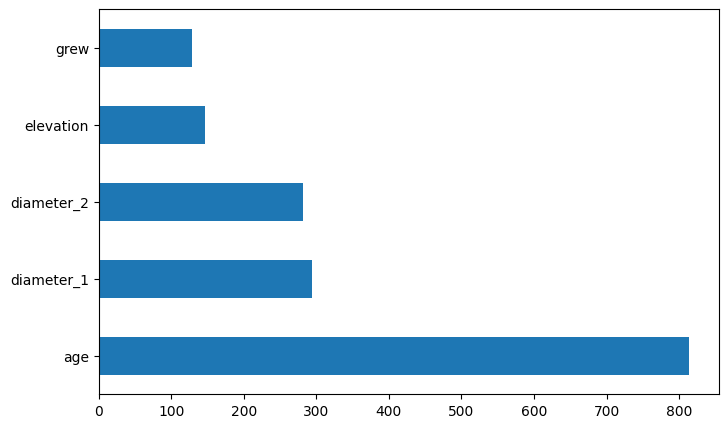

In [32]:
feature_importances = pd.Series(best_lgbm_model.feature_importances_,index = columnas)
feature_importances.nlargest(5).plot(kind='barh', color = '#1e77b4', figsize = (8, 5))

### Comparación entre modelos

In [41]:
models = [random_forest_best_model, best_model_svm, extra_best_model,decision_best_model, best_knn,best_ada,best_xg,best_cat,best_lgbm_model]

y_test_reshaped = np.array(y_test2).reshape(-1, 1)
y_pred_reshaped = np.array(y_pred).reshape(-1, 1)
y_bin = label_binarize(y2, classes=np.unique(y2))

for model in models:
    model.fit(X2, y2)
    y_pred = model.predict(X_test2)
    
    if hasattr(model, 'predict_proba'):
        auc_roc = roc_auc_score(y_test2, model.predict_proba(X_test2), multi_class='ovr')
    else:
        print(f"Model {type(model).__name__} does not support probability estimates.")
        auc_roc = None
    
    print(model)
    print()
    print("Accuracy:", accuracy_score(y_test2, y_pred))
    print("Precision:", precision_score(y_test2, y_pred, average='weighted'))
    print("Recall:", recall_score(y_test2, y_pred, average='weighted'))
    print("F1 Score:", f1_score(y_test2, y_pred, average='weighted'))
    if auc_roc is not None:
        print("AUC-ROC:", auc_roc)
    else:
        print("AUC-ROC: Not applicable")
    print("Mean Squared Error:", mean_squared_error(y_test2, y_pred))
    print()
    print("-------------------------------------------------------------------")
    print()



RandomForestClassifier(max_depth=20, random_state=31)

Accuracy: 0.8153310104529616
Precision: 0.816524069859655
Recall: 0.8153310104529616
F1 Score: 0.8080805073626932
AUC-ROC: 0.950985701459575
Mean Squared Error: 1.6445993031358885

-------------------------------------------------------------------

Model SVC does not support probability estimates.
SVC(C=15, kernel='linear')

Accuracy: 0.7473867595818815
Precision: 0.6759863625680306
Recall: 0.7473867595818815
F1 Score: 0.7063666607059088
AUC-ROC: Not applicable
Mean Squared Error: 2.132404181184669

-------------------------------------------------------------------



C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


ExtraTreesClassifier(max_features='log2', n_estimators=1000, random_state=36)

Accuracy: 0.8083623693379791
Precision: 0.8089626081240674
Recall: 0.8083623693379791
F1 Score: 0.8020160700964631
AUC-ROC: 0.9500298109157632
Mean Squared Error: 1.5452961672473868

-------------------------------------------------------------------

DecisionTreeClassifier(class_weight={0: 1, 1: 2, 2: 1}, max_depth=10,
                       min_samples_leaf=2, min_samples_split=10,
                       random_state=42)

Accuracy: 0.7195121951219512
Precision: 0.6984404771588192
Recall: 0.7195121951219512
F1 Score: 0.6953218080925258
AUC-ROC: 0.8738244658735623
Mean Squared Error: 2.775261324041812

-------------------------------------------------------------------

KNeighborsClassifier(n_neighbors=7, p=1, weights='distance')

Accuracy: 0.7735191637630662
Precision: 0.7840295883024879
Recall: 0.7735191637630662
F1 Score: 0.7677505502823077
AUC-ROC: 0.9025179714148454
Mean Squared Error: 1.770034843205574

C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\sklearn\metrics\_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\xgboost\data.py:335: FutureWarning: is_sparse is deprecated and will be removed in a future version. Check `isinstance(dtype, pd.SparseDtype)` instead.
  if is_sparse(dtype):
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\xgboost\data.py:338: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  is_categorical_dtype(dtype) or is_pa_ext_categorical_dtype(dtype)
C:\Users\Usuario\AppData\Roaming\Python\Python310\site-packages\xgboost\data.py:384: FutureWarning: is_categorical_dtype is deprecated and will be

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              gamma=None, grow_policy=None, importance_type=None,
              interaction_constraints=None, learning_rate=0.1, max_bin=None,
              max_cat_threshold=None, max_cat_to_onehot=None,
              max_delta_step=None, max_depth=5, max_leaves=None,
              min_child_weight=None, missing=nan, monotone_constraints=None,
              multi_strategy=None, n_estimators=200, n_jobs=None,
              num_parallel_tree=None, objective='multi:softprob', ...)

Accuracy: 0.8066202090592335
Precision: 0.80418662365068
Recall: 0.8066202090592335
F1 Score: 0.8010199586694888
AUC-ROC: 0.9491722068674692
Mean Squared Error: 1.78397212543554

----------------------------------------------------------